## Author : Indumathi Pandiyan

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00008B;"> Unsupervised Learning Project - 4th Project submitted for PGP-AIML Great Learning on 16-Jan-2022

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> Part A - 30 Marks

**• DOMAIN:** Automobile <br>

**• CONTEXT:** The data concerns city-cycle fuel consumption in miles per gallon to be predicted in terms of 3 multivalued discrete and 5
continuous attributes <br>

**• DATA Description:** <br>


|S.No | Feature Name| Type  | 
|---:|:-------------|:-----------|
| 1 | cylinders |  multi-valued discrete      |
| 2 | displacement |continuous   |
| 3 | horsepower | continuous    |
| 4 | weight | continuous    | 
| 5 | mpg | continuous    |
| 6 | acceleration | continuous    |
| 7 | model year | multi-valued discrete    |
| 8 | origin | multi-valued discrete | 
| 9 | car name | string (unique for each instance)  | 


**PROJECT OBJECTIVE:**<br> We will build a classifier to predict the Pass/Fail yield of a particular process entity and analyse whether all the
features are required to build the model or not.


## STEPS AND TASK [30 Marks]:
<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">1. Data Understanding & Exploration: [5 Marks]

### Importing Required Libraries

In [150]:
import pandas as pd
from sklearn.cluster import KMeans 
import matplotlib.pyplot as plt
import seaborn as sns

In [151]:
# Ignore warnings
import warnings
warnings.filterwarnings("ignore")
#

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">A. Read ‘Car name.csv’ as a DataFrame and assign it to a variable. [1 Mark]

In [4]:
carname = pd.read_csv('Car name.csv')  # import the csv file
carname.head(5)

,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


In [5]:
carname.shape

(398, 1)

**Observation 1:** There are 398 Observations / Rows and there is only one column in carname dataset. That is carname.

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> B. Read ‘Car-Attributes.json as a DataFrame and assign it to a variable. [1 Mark]

In [6]:
#Reading a json file from DataFrame and assign to a variable
carAttributes = pd.read_json("Car-Attributes.json")
carAttributes.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


In [7]:
carAttributes.shape

(398, 8)

**Observation 2 :** There are 398 Observations / Rows and there are 8 attributes in carAttribute dataset. 

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> C. Merge both the DataFrames together to form a single DataFrame [2 Mark]

### Merging to one dataframe

In [8]:
##As there is common columns, combining the dataframes through index
car_df=carname.join(carAttributes)
car_df.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


In [9]:
car_df.dtypes

car_name     object
mpg         float64
cyl           int64
disp        float64
hp           object
wt            int64
acc         float64
yr            int64
origin        int64
dtype: object

### Comments:

Car name is object datatype. hp is object datatype it will be converted into numerical value as it holds the metric of horspepower.

### Data Understanding

|S.No | Feature Name |Feature Description| Type  | Feauture Understanding |
|---:|:-------------|:-------------|:-----------|-----------|
| 1 | car_name|car name | string (unique for each instance)  | Name of the car|
| 2 | mpg| miles per gallon | continuous    | is the distance, measured in miles, that a car can travel per gallon of fuel|
| 3 | cyl|cylinders |  multi-valued discrete      |Number of Cylinders, where fuel is burnt and convered to mechanical energy|
| 4 | disp| displacement |continuous   |Engine capacity (displacement), of a car is the combined volume of all its cylinders.|
| 5 | hp| horsepower | continuous    |the power produced by a car's engine, the higher the number, the more power is sent to the wheels and the faster it will go|
| 6 | wt| weight | continuous    | Car weight|
| 7 | acc| acceleration | continuous    |Acceleration is the rate of change of velocity as a function of time|
| 8 | yr| model year | multi-valued discrete    | Model year|
| 9 | origin| origin | multi-valued discrete |origin location |


**Comments**: For better understanding the data the table is made. It describes about what exactly what each column means. 
This would help to comprehend how one feature might impact others

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> D. Print 5 point summary of the numerical features and share insights. [1 Marks]

In [10]:
car_df.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0
origin,398.0,1.572864,0.802055,1.0,1.000,1.0,2.000,3.0


### 5 Point Summary Insights



**Comments:** Describe function in Python to see the Five Number Summary and other details of the data. 
describe() function gives us the count and mean of the features including the summary values.

**5 Point summary (or) Five Number summary:** has following statistical quanties.<br>
**Median:** The middle value in the sample, also called the 50th percentile or the 2nd quartile.<br>
**1st Quartile:** The 25th percentile.<br>
**3rd Quartile:** The 75th percentile.<br>
**Minimum:** The smallest observation in the sample.<br>
**Maximum:** The largest observation in the sample.

**Use**:It can be used to describe the distribution of data samples for data with any distribution

From the existing data set, following are the numerical attributes<br>

**mpg**<br>
**cyl**<br>
**disp**<br>
**wt**<br>
**acc**<br>
**yr**<br>
**origin**<br>

#### Observation on information on the type of variable and min-max values

* **`mpg`**:  numerical (continuous), quantitative, interval. Min 9.00 and highest value 46.600
* **`cyl`**:  numerical (discrete), quantitative, interval. Min 3.00 and highest value 8.00
* **`disp`**:  numerical (continuous), quantitative, interval. Min  68.00 and highest value 455.00
* **`wt`**:  numerical (continuous), quantitative, interval. Min 1613.00 and highest value 5140.00    
* **`acc`**:  numerical (continuous), quantitative, interval. Min P_radius 8.0 and highest value 24.80
* **`yr`**:  numerical (discrete ), quantitative, interval. Min S_Degree 70.0 and highest value 82.00
* **`origin`**:  numerical (discrete), quantitative, interval. Min 1 and highest value 3

#### Observation on Descriptive Statistics for the numerical variables
Descriptive statistics for the numerical variables (mpg, cyl, disp, wt, acc, yr,origin)

* **`mpg`**: Range of Q1 to Q3 is between 17.500 to 29.000. Since the mean(23.514573) is greater than median(23.0), we can say mpg is right (positively) skewed.
* **`cyl`**:  Range of Q1 to Q3 is between 4.000 to 8.00. Since the mean(5.454774) is greater than median(4.0), we can say that cyl is right (positively) skewed.
* **`disp`**:  Range of Q1 to Q3 is between 104.250 to 262.000. Since the mean(193.425879) is greater than median(148.5), we can say that disp is right (positively) skewed.
* **`wt`**:  Range of Q1 to Q3 is between 2223.750 to 3608.000. Since the mean(2970.424623) is greater than median(2803.5), is almost similar to median, we can say that wt is right(positively) skewed.
* **`acc`**:  Range of Q1 to Q3 is between 13.825 to 17.175. Since the mean(15.568090) is almost equal as median(15.5), we can say that acc is normally distributed.
* **`yr`**: Range of Q1 to Q3 is between 73.000 to 79.00. Since the mean(76.010050) is almost equal as median(76.0), we can say that year is normally distributed.
* **`origin`**: Range of Q1 to Q3 is between 1.000 to 2.000. Since the mean(1.572864) is greater than median(1.0), we can say that origin is right (positively) skewed.


<span style="font-family: Arial; font-weight:bold;font-size:1.75em;color:#00b3e5;"> 2.Data Preparation & Analysis: [10 Marks]

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">A.Check and print feature-wise percentage of missing values present in the data and impute with the best suitable approach. [2 Mark]

In [11]:
 car_df.isnull().sum()

car_name    0
mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
dtype: int64

In [12]:
percent_missing = car_df.isnull().sum() * 100 / len(car_df)
missing_value_data = pd.DataFrame({'Feature Name': car_df.columns,
                                 'percent_missing': percent_missing})
print(missing_value_data)

         Feature Name  percent_missing
car_name     car_name              0.0
mpg               mpg              0.0
cyl               cyl              0.0
disp             disp              0.0
hp                 hp              0.0
wt                 wt              0.0
acc               acc              0.0
yr                 yr              0.0
origin         origin              0.0


**Comments:** No feature has null values

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> B. Check for duplicate values in the data and impute with the best suitable approach. [1 Mark]

In [13]:
car_df.duplicated().sum()

0

**Comments:** No duplicate values found

### Understanding the categorical values

In [14]:
# This function would return all the categorical variables of a dataset
import numpy as np
def findCategoricalData(data):
    categorical_cols=data.select_dtypes(exclude=[np.number]).columns
    return categorical_cols

In [15]:
findCategoricalData(car_df)

Index(['car_name', 'hp'], dtype='object')

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> C. Plot a pairplot for all features. [1 Marks]


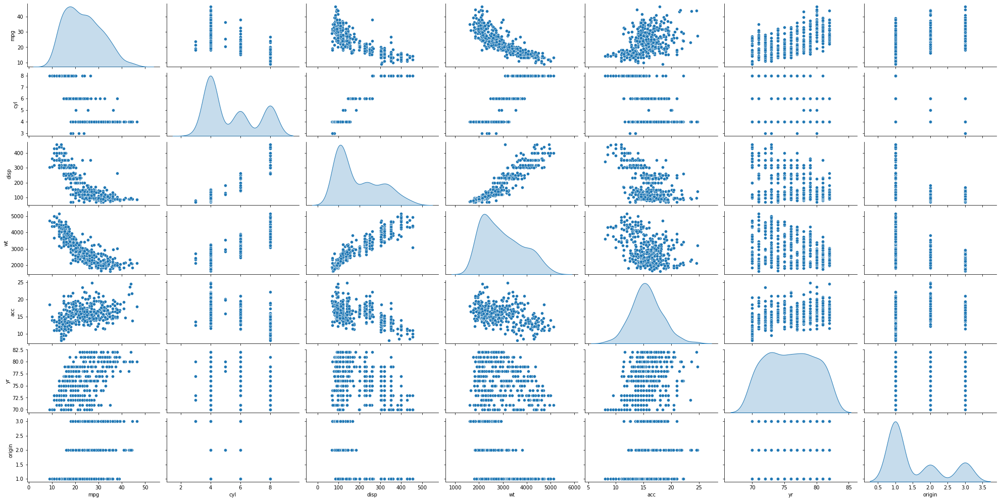

In [16]:
#importing seaborn for statistical plots
import seaborn as sns
sns.pairplot(car_df, height=2,aspect=2 , diag_kind='kde')

**Comments:**

1. Displacement and weight has positive correlation <br>
2. mpg has negative correlation with Displacement and weight <br>
3. acc - acceleration is equally distributed but seems to have any correlation with other varibles<br>

**Observation on possibility of Number of clusters** <br>
Through the observation on pairplots it is been noticed that, there may be 3 clusters based on Number of Cynlinders, displacement and origin.


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> D. Visualize a scatterplot for ‘wt’ and ‘disp’. Datapoints should be distinguishable by ‘cyl’. [1 Marks]

<AxesSubplot:xlabel='wt', ylabel='disp'>

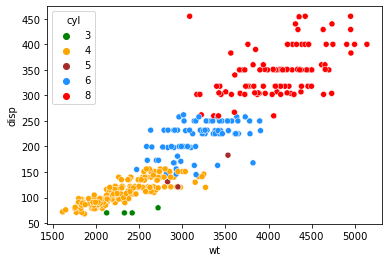

In [17]:
import seaborn as sns
palette=['green','orange','brown','dodgerblue','red']
sns.scatterplot(x='wt', y='disp', data=car_df, hue='cyl', palette=palette, sizes=(30, 200), legend='brief')

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> E.Share insights for Q2.d. [1 Marks]

**Observation**

The parameters **wt(weight)** and **disp(displacement)** are positively correlated. More the weight, more displacement is there. My understanding wise, for heavy vehicle, it needs more number of cylinders and hence more displacement values.

Moreover, by visualizing the scatterplot even there 5 types of number of cylinders, we can figure out **prominent 3 groups.**<br>
1. with 4 cylinders <br>
2. With 6 cylinders <br>
3. With 8 cylinders <br>

And the data for cylinders 3 and 5 is very meagre. <br>


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> F.Visualize a scatterplot for ‘wt’ and ’mpg’. Datapoints should be distinguishable by ‘cyl’. [1 Marks]

<AxesSubplot:xlabel='wt', ylabel='mpg'>

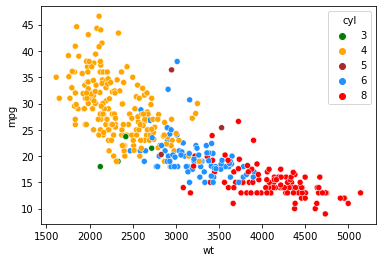

In [18]:
#sns.lmplot(x="wt", y="mpg", data=car_df, hue="cyl")
import seaborn as sns
palette=['green','orange','brown','dodgerblue','red']
sns.scatterplot(x='wt', y='mpg', data=car_df, hue='cyl', palette=palette, sizes=(30, 200), legend='brief')

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> G.Share insights for Q2.f. [1 Marks]

**Car weight(wt)** and **milesperGallon(mpg)** are negatively correlated based on the scatter plot drawn. It is understood that increase in car weight, causes reduction /decrease in miles per  gallon.<br>
When analysed by distinguishing the data points through the cylinder, its obvious all data points can be grouped based on the number of cylinder.<br>
1. **"mpg"** is more/ high when number of cylinders are 4. Maximum mpg is reached when less weight and number of cylinders are 4.
2. It is been also observed that few data points having number of cylinders as 6, have high mpg, when its weight is around 3000
3. When weight increases, more number of cylinders are used and there is decrease in mpg
4. For the weight between 2750 and 3500, while using 5 cylinders, mpg is better compared to cylinders 6 or 8.
5. mpg is low for heavy vehicles and vice versa for light weighted vehicle


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> H.Check for unexpected values in all the features and datapoints with such values.[Hint: ‘?’ is present in ‘hp’]

In [19]:
car_df.head(5)

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140,3449,10.5,70,1


**Comments**: by verifying the just headers the unexpected values are not found. Hence saving the dataframe to a csv file 
and verified for any unexpected value

In [20]:
car_df.to_csv('Car_df.csv')

In [21]:
 car_df.isna().any()

car_name    False
mpg         False
cyl         False
disp        False
hp          False
wt          False
acc         False
yr          False
origin      False
dtype: bool

In [22]:
# Find the any unexpected value in the dataframe
car_df.isin(['?']).any()
    

car_name    False
mpg         False
cyl         False
disp        False
hp           True
wt          False
acc         False
yr          False
origin      False
dtype: bool

In [23]:
print(car_df.loc[car_df['hp'] == '?'])

                 car_name   mpg  cyl   disp hp    wt   acc  yr  origin
32             ford pinto  25.0    4   98.0  ?  2046  19.0  71       1
126         ford maverick  21.0    6  200.0  ?  2875  17.0  74       1
330  renault lecar deluxe  40.9    4   85.0  ?  1835  17.3  80       2
336    ford mustang cobra  23.6    4  140.0  ?  2905  14.3  80       1
354           renault 18i  34.5    4  100.0  ?  2320  15.8  81       2
374        amc concord dl  23.0    4  151.0  ?  3035  20.5  82       1


In [24]:
print(len(car_df.loc[car_df['hp'] == '?']))

6


### Comments : 
There are 6 rows in the hp feature has question mark (?) in the car dataframe

In [25]:
car_df.dtypes

car_name     object
mpg         float64
cyl           int64
disp        float64
hp           object
wt            int64
acc         float64
yr            int64
origin        int64
dtype: object

**Comments**: hp is object datatype and converting to a numeric value

In [26]:
car_df['hp'] = pd.to_numeric(car_df['hp'], errors='coerce')

In [27]:
car_df.dtypes

car_name     object
mpg         float64
cyl           int64
disp        float64
hp          float64
wt            int64
acc         float64
yr            int64
origin        int64
dtype: object

In [28]:
print(car_df.loc[car_df['hp'].isnull()])

                 car_name   mpg  cyl   disp  hp    wt   acc  yr  origin
32             ford pinto  25.0    4   98.0 NaN  2046  19.0  71       1
126         ford maverick  21.0    6  200.0 NaN  2875  17.0  74       1
330  renault lecar deluxe  40.9    4   85.0 NaN  1835  17.3  80       2
336    ford mustang cobra  23.6    4  140.0 NaN  2905  14.3  80       1
354           renault 18i  34.5    4  100.0 NaN  2320  15.8  81       2
374        amc concord dl  23.0    4  151.0 NaN  3035  20.5  82       1


In [29]:
#Finding the columns which has any null value
null_columns=car_df.columns[car_df.isnull().any()]
noOfNullColumns=car_df[null_columns].isnull().sum()
print(noOfNullColumns)

# Finding the rows in which null values are available
nullindices=car_df[car_df["hp"].isnull()][null_columns]
print(nullindices.index)

hp    6
dtype: int64
Int64Index([32, 126, 330, 336, 354, 374], dtype='int64')


In [30]:
# Print the rows in which Total charges are null or NaN              
car_df[['cyl','disp','wt','hp']].iloc[car_df.index.isin(nullindices.index)]

,cyl,disp,wt,hp
32,4,98.0,2046,NaN
126,6,200.0,2875,NaN
330,4,85.0,1835,NaN
336,4,140.0,2905,NaN
354,4,100.0,2320,NaN
374,4,151.0,3035,NaN


In [31]:
#instead of dropping the rows, lets replace the missing values with median value. 
car_df.median()

mpg         23.0
cyl          4.0
disp       148.5
hp          93.5
wt        2803.5
acc         15.5
yr          76.0
origin       1.0
dtype: float64

#### Copying the dataset to new dataset before doing any imputation

In [32]:
car_new=car_df.copy()

In [33]:
car_new['hp']  = car_new['hp'].fillna(car_new['hp'].median())

In [34]:
car_new[['cyl','disp','wt','hp']].iloc[car_new.index.isin(nullindices.index)]

,cyl,disp,wt,hp
32,4,98.0,2046,93.5
126,6,200.0,2875,93.5
330,4,85.0,1835,93.5
336,4,140.0,2905,93.5
354,4,100.0,2320,93.5
374,4,151.0,3035,93.5


**Comments:**
All the missing values of hp is replaced by the median of hp

In [35]:
car_new.dtypes

car_name     object
mpg         float64
cyl           int64
disp        float64
hp          float64
wt            int64
acc         float64
yr            int64
origin        int64
dtype: object

#### Comments: Other than Car name all are numerical

## Scale the data before Performing the Kmeans

In [36]:
from scipy.stats import zscore
#car_new_attr=car_new.iloc[:,1:]
car_new_attr=car_new.iloc[:,1:8]
scaled_df=car_new_attr.apply(zscore)
scaled_df.head()

,mpg,cyl,disp,hp,wt,acc,yr
0,-0.706439,1.498191,1.090604,0.673118,0.630870,-1.295498,-1.627426
1,-1.090751,1.498191,1.503514,1.589958,0.854333,-1.477038,-1.627426
2,-0.706439,1.498191,1.196232,1.197027,0.550470,-1.658577,-1.627426
3,-0.962647,1.498191,1.061796,1.197027,0.546923,-1.295498,-1.627426
4,-0.834543,1.498191,1.042591,0.935072,0.565841,-1.840117,-1.627426


In [37]:
#Visualizing heat map to visualize all correlation
corr =scaled_df.corr()
print(corr)

           mpg       cyl      disp        hp        wt       acc        yr
mpg   1.000000 -0.775396 -0.804203 -0.773453 -0.831741  0.420289  0.579267
cyl  -0.775396  1.000000  0.950721  0.841284  0.896017 -0.505419 -0.348746
disp -0.804203  0.950721  1.000000  0.895778  0.932824 -0.543684 -0.370164
hp   -0.773453  0.841284  0.895778  1.000000  0.862442 -0.686590 -0.413733
wt   -0.831741  0.896017  0.932824  0.862442  1.000000 -0.417457 -0.306564
acc   0.420289 -0.505419 -0.543684 -0.686590 -0.417457  1.000000  0.288137
yr    0.579267 -0.348746 -0.370164 -0.413733 -0.306564  0.288137  1.000000


### Observation
1. hp has positive correlation with weight and dispension
2. hp has negative correlation with mpg and accelertation
3. with hp too, 3 groups possible


Text(0.5, 1.0, 'Heat map of carattributes data')

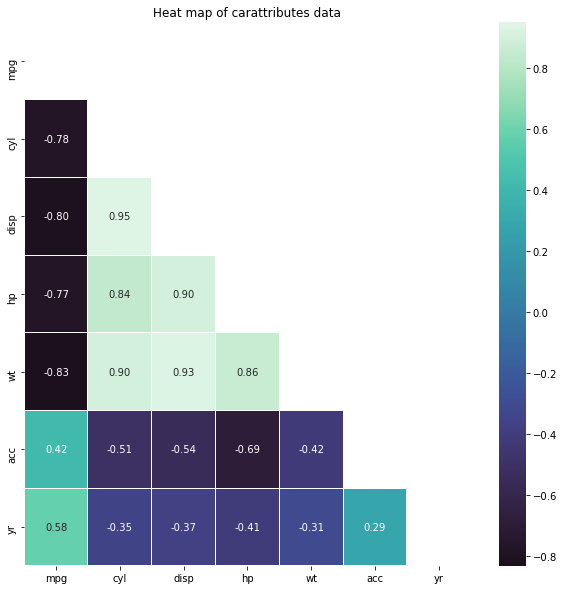

In [38]:
fig, ax = plt.subplots(figsize=(10,10))
#sns.heatmap(df2.corr(), center=0, cmap='BrBG', annot=True)
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(scaled_df.corr(), center=0, cmap='mako', annot=True, fmt='.2f', linewidths=0.05, mask=mask)
ax.set_title('Heat map of carattributes data')

In [39]:
# Filter for correlation value greater than 0.5
sort = corr.abs().unstack()
sort = sort.sort_values(kind = "quicksort", ascending = False)
sort[(sort > 0.8) & (sort < 1)]

disp  cyl     0.950721
cyl   disp    0.950721
wt    disp    0.932824
disp  wt      0.932824
cyl   wt      0.896017
wt    cyl     0.896017
disp  hp      0.895778
hp    disp    0.895778
wt    hp      0.862442
hp    wt      0.862442
cyl   hp      0.841284
hp    cyl     0.841284
mpg   wt      0.831741
wt    mpg     0.831741
mpg   disp    0.804203
disp  mpg     0.804203
dtype: float64

**Observation**

1.Number of cycles and dispension are highly positive correlated(0.95)<br>
2.weight and dispension are highly positievly correlated(0.93)<br>
3.cyl and weight, hp and disp are highly positively correlated(0.89)


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> 3.Clustering: [15 Marks]

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> 1. Apply K-Means clustering for 2 to 10 clusters. [3 Marks]

In [40]:
# Import the Kmeans library
from sklearn.cluster import KMeans 
import matplotlib.pyplot as plt

In [41]:
car_new.head()

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140.0,3449,10.5,70,1


In [42]:
scaled_df.head()

,mpg,cyl,disp,hp,wt,acc,yr
0,-0.706439,1.498191,1.090604,0.673118,0.630870,-1.295498,-1.627426
1,-1.090751,1.498191,1.503514,1.589958,0.854333,-1.477038,-1.627426
2,-0.706439,1.498191,1.196232,1.197027,0.550470,-1.658577,-1.627426
3,-0.962647,1.498191,1.061796,1.197027,0.546923,-1.295498,-1.627426
4,-0.834543,1.498191,1.042591,0.935072,0.565841,-1.840117,-1.627426


## Creating Clusters using KMeans

In [43]:
# Create K Means cluster and store the result in the object k_means
k_means = KMeans(n_clusters = 2)

In [44]:
# Fit K means on the scaled_df
k_means.fit(scaled_df)

KMeans(n_clusters=2)

### Cluster Output for all the observations

In [45]:
# Get the labels
k_means.labels_

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0,
       0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0,

## Within Cluster Sum of Squares

In [46]:
k_means.inertia_

1294.8418950727323

#### Metod to create Kmeans model based on 'n' passed

In [47]:
def checkCluster(n):
    k_means = KMeans(n_clusters = n)
    k_means.fit(scaled_df)
    print(n,k_means.inertia_)

### Apply K-Means clustering for 2 to 10 clusters

In [48]:
for i in range(2,11):
    checkCluster(i)

2 1294.8418950727323
3 946.3331203918414
4 738.4159737149639
5 665.0078531851541
6 594.8662559115438
7 540.0218766711487
8 496.7215993468482
9 454.59590240409557
10 423.1608929693084


#### Comments: Within Cluster Sum of Squares value keeps decreasing. 

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> B.Plot a visual and find elbow point. [2 Marks]

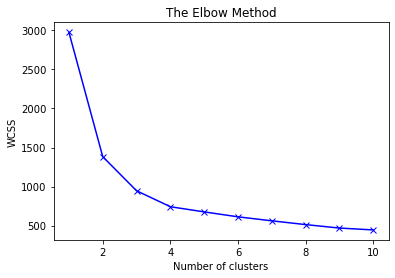

In [152]:
# Using the elbow method to find  the optimal number of clusters
from sklearn.cluster import KMeans

wcss=[]

for i in range (1,11):
    kmeans=KMeans(n_clusters=i,init='k-means++', max_iter=100, random_state=0)
    kmeans.fit(scaled_df)
    wcss.append(kmeans.inertia_)
plt.plot(range(1,11),wcss,'bx-')
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


Text(0.5, 1.0, 'Selecting k with the Elbow Method')

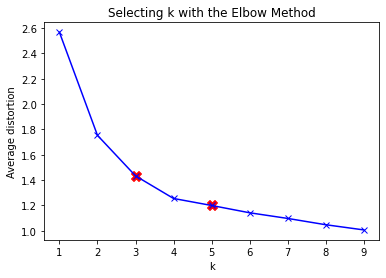

In [153]:
#Finding optimal no. of clusters
from scipy.spatial.distance import cdist
clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(scaled_df)
    prediction=model.predict(scaled_df)
    meanDistortions.append(sum(np.min(cdist(scaled_df, model.cluster_centers_, 'euclidean'), axis=1)) / scaled_df.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.scatter(3, meanDistortions[2], marker="X", s=100, c="r")
plt.scatter(5, meanDistortions[4], marker="X", s=100, c="r")
plt.title('Selecting k with the Elbow Method')

**Comments:**
There is no clear elbow, there are two bends one at 3 and one at 5

### Using silhoutte score to find the optimal number

#### Silhouette coefficient is a measure of how similar a datapoint is to its own cluster compared to that of other clusters. In previous step, its been identified that, the elbow point is either 3 or 5. Hence trying to using sihoutte score will find the best cluster among two.

2 0.4823594610391611
3 0.35314791198988205
4 0.34844881731503
5 0.31681169692082417
6 0.2743907543364381
[0.4823594610391611, 0.35314791198988205, 0.34844881731503, 0.31681169692082417, 0.2743907543364381]


Text(0.5, 1.0, 'Selecting k with the Sihoutte Method')

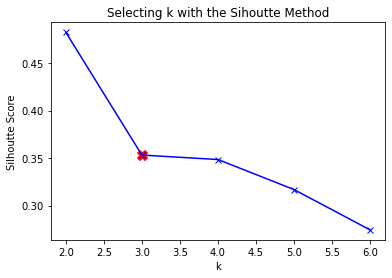

In [50]:
from sklearn.metrics import silhouette_score

sil = []
#kmax = 10
clusters=range(2,7)
# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in clusters:
  k_means = KMeans(n_clusters = k)
  k_means.fit(scaled_df)
  labels = k_means.labels_
  silhoutte_score_for_k=silhouette_score(scaled_df, labels, metric = 'euclidean')
  print(k,silhoutte_score_for_k)
  sil.append(silhoutte_score_for_k)

print(sil)
plt.plot(clusters, sil, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhoutte Score')
plt.scatter(3, sil[1], marker="X", s=100, c="r")
plt.title('Selecting k with the Sihoutte Method')

## Comments 

* The Elbow Method is more of a decision rule, while the Silhouette is a metric used for validation while clustering. Thus, it can be used in combination with the Elbow Method.
* Therefore, the Elbow Method and the Silhouette Method are not alternatives to each other for finding the optimal K.
* Rather they are tools to be used together for a more confident decision.

**Based on the silhoutte score, 3 is better than 5.**

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> C.On the above visual, highlight which are the possible Elbow points. [1 Marks]

knee Location  3


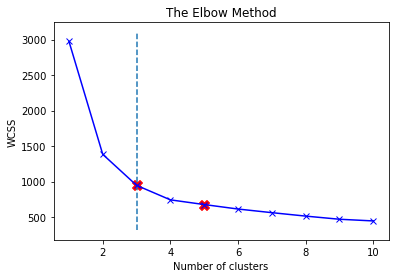

In [154]:
# Using the elbow method to find  the optimal number of clusters
from sklearn.cluster import KMeans

wcss=[]
clusters=range(1,11)
for i in clusters:
    kmeans=KMeans(n_clusters=i,init='k-means++', max_iter=100, random_state=0)
    kmeans.fit(scaled_df)
    wcss.append(kmeans.inertia_)
    

from kneed import KneeLocator
kn = KneeLocator(clusters, wcss, curve='convex', direction='decreasing')
print('knee Location ', kn.knee)

plt.plot(range(1,11),wcss,'bx-')
plt.title('The Elbow Method')
plt.scatter(3, wcss[2], marker="X", s=100, c="r")
plt.scatter(5, wcss[4], marker="X", s=100, c="r")
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.vlines(kn.knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')
plt.show()


## Comments:


In previous steps, first through elbow method its been identified either 3 or 5 would be the optimal number of cluster. And among silhoutte scores of 3 and 5, Silhoutte score for 3[0.353] is higher than 5[0.348].<br>
More silhoutte score, better the cluster. so, **3 would be optimal cluster** for our case.

And KneeLocator also gives 3 is the knee location. So finalized 3 as the optimal cluster number

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> D.Train a K-means clustering model once again on the optimal number of clusters. [3 Marks]


In [53]:
car_new.head()


,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,70,1
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,70,1
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,70,1
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,70,1
4,ford torino,17.0,8,302.0,140.0,3449,10.5,70,1


In [54]:
# Let us first start with K = 3
final_model=KMeans(3)
final_model.fit(scaled_df)
prediction=final_model.predict(scaled_df)

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> E.Add a new feature in the DataFrame which will have labels based upon cluster value. [2 Marks]

In [55]:
#Append the prediction 
car_new["cluster"] = prediction
scaled_df["cluster"] = prediction
print("Groups Assigned : \n")
car_new.head()

Groups Assigned : 



,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin,cluster
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,70,1,0
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,70,1,0
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,70,1,0
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,70,1,0
4,ford torino,17.0,8,302.0,140.0,3449,10.5,70,1,0


In [56]:
carCluster = car_new.groupby(['cluster'])
carCluster.mean()

,mpg,cyl,disp,hp,wt,acc,yr,origin
cluster,,,,,,,,
0,14.469474,8.000000,349.705263,162.105263,4154.526316,12.604211,73.526316,1.00000
1,29.400000,4.004831,109.780193,78.533816,2306.067633,16.563285,77.154589,2.00000
2,19.775000,6.062500,219.135417,102.671875,3231.177083,16.355208,76.000000,1.21875


## Cluster Profiling

In [57]:
clust_profile=car_new.drop(['car_name'],axis=1)
clust_profile=clust_profile.groupby('cluster').mean()
clust_profile['freq']=car_new.cluster.value_counts().sort_index()
clust_profile

,mpg,cyl,disp,hp,wt,acc,yr,origin,freq
cluster,,,,,,,,,
0,14.469474,8.000000,349.705263,162.105263,4154.526316,12.604211,73.526316,1.00000,95
1,29.400000,4.004831,109.780193,78.533816,2306.067633,16.563285,77.154589,2.00000,207
2,19.775000,6.062500,219.135417,102.671875,3231.177083,16.355208,76.000000,1.21875,96


**Comments:**


**Cluster 0:** Heavy weighted cars with more number of (8) cylinders with highest horse power, and less miles per gallon <br>
**Cluster 1:** Lowest weighed cars with less number of cylinders, least horse power and most miles per gallon <br>
**Cluster 2:** Medium weighed cars with medium number of cylinders, average horse power and medium miles per gallon<br>


array([[<AxesSubplot:title={'center':'acc'}, xlabel='[cluster]'>,
        <AxesSubplot:title={'center':'cyl'}, xlabel='[cluster]'>,
        <AxesSubplot:title={'center':'disp'}, xlabel='[cluster]'>,
        <AxesSubplot:title={'center':'hp'}, xlabel='[cluster]'>],
       [<AxesSubplot:title={'center':'mpg'}, xlabel='[cluster]'>,
        <AxesSubplot:title={'center':'wt'}, xlabel='[cluster]'>,
        <AxesSubplot:title={'center':'yr'}, xlabel='[cluster]'>,
        <AxesSubplot:>]], dtype=object)

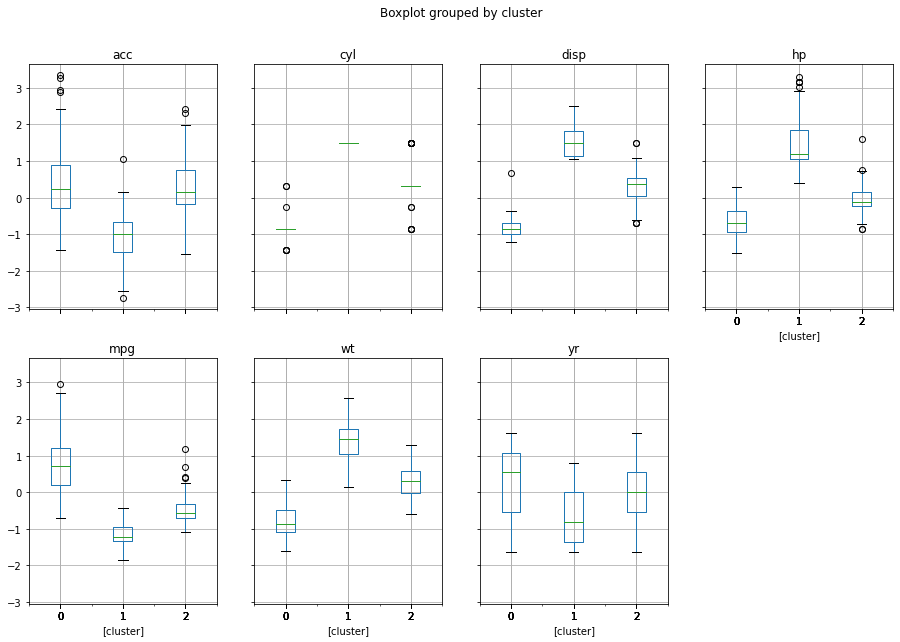

In [64]:
scaled_df.boxplot(by='cluster', layout = (2,4),figsize=(15,10))

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> F. Plot a visual and color the datapoints based upon clusters. [2 Marks]

## Plotting the scatter plot


[0 1 2]


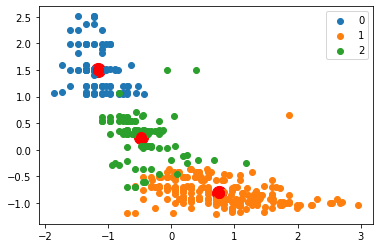

In [141]:
#Getting unique labels
 
u_labels = np.unique(prediction)
print(u_labels)
# Plot the clusters 
plt.scatter(final_model.cluster_centers_[:, 0], 
            final_model.cluster_centers_[:, 2], 
            s=200,                             # Set centroid size
            c='red')
#plotting the results:
for i in u_labels:
    plt.scatter(scaled_df.iloc[prediction == i , 0] , scaled_df.iloc[prediction == i , 2] , label = i)
    plt.scatter(final_model.cluster_centers_[:, 0], final_model.cluster_centers_[:, 2], s=100,    #Set centroid size
            c='red')
plt.legend()
plt.show()

**Comments:**:
While plotting againg **mpg** and **disp**, there are clear 3 clusters visible with centroid apart

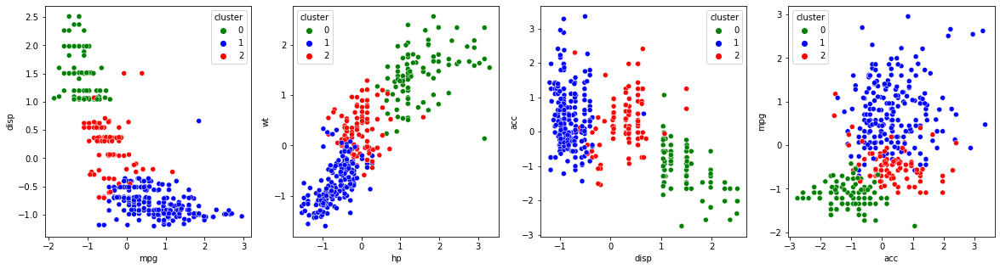

In [76]:
plt.figure(figsize=(20,5))
#palette=['green','orange','brown','dodgerblue','red']
palette=['green','blue','red']
plt.subplot(1, 4, 1)
sns.scatterplot(x="mpg", y="disp",data=scaled_df, hue="cluster", palette=palette)
#
plt.subplot(1, 4, 2)
sns.scatterplot(x="hp", y="wt",data=scaled_df, hue="cluster",palette=palette)
#
plt.subplot(1, 4, 3)
sns.scatterplot(x="disp", y="acc", data=scaled_df, hue="cluster",palette=palette)
#
plt.subplot(1, 4, 4)
sns.scatterplot(x="acc", y= "mpg", data=scaled_df, hue="cluster",palette=palette)
#

plt.show();

<AxesSubplot:xlabel='mpg', ylabel='disp'>

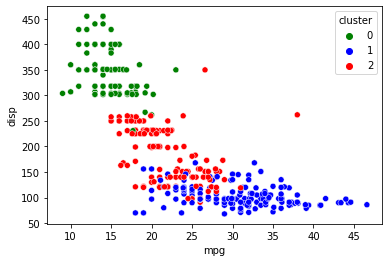

In [219]:
import seaborn as sns
palette=['green','blue','red']
sns.scatterplot(x="mpg", y="disp", data=car_new, hue="cluster",palette=palette)

In [222]:
from mpl_toolkits.mplot3d import Axes3D

In [223]:
scaled_df.head(5)

,mpg,cyl,disp,hp,wt,acc,yr,origin,cluster
0,-0.706439,1.498191,1.090604,0.673118,0.630870,-1.295498,-1.627426,-0.715145,0
1,-1.090751,1.498191,1.503514,1.589958,0.854333,-1.477038,-1.627426,-0.715145,0
2,-0.706439,1.498191,1.196232,1.197027,0.550470,-1.658577,-1.627426,-0.715145,0
3,-0.962647,1.498191,1.061796,1.197027,0.546923,-1.295498,-1.627426,-0.715145,0
4,-0.834543,1.498191,1.042591,0.935072,0.565841,-1.840117,-1.627426,-0.715145,0


<ipython-input-246-94ec62307025>:9: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ax.scatter(scaled_df.iloc[:, 0], scaled_df.iloc[:, 3], scaled_df.iloc[:, 4],c=labels.astype(np.float), edgecolor='k')


Text(0.5, 0.92, '3D plot of KMeans Clustering')

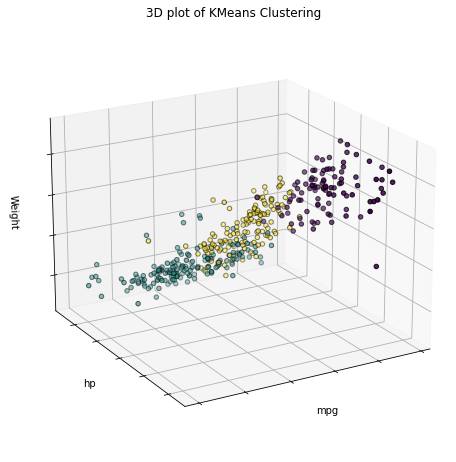

In [246]:
## 3D plots of clusters
fig = plt.figure(figsize=(8, 6))
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=20, azim=60)
#kmeans.fit(scaled_df)
labels = final_model.labels_
#ax.scatter(scaled_df.iloc[:, 0], scaled_df.iloc[:, 1], scaled_df.iloc[:, 3],c=labels.astype(np.float), edgecolor='k')
#ax.scatter(scaled_df.iloc[:, 0], scaled_df.iloc[:, 4],c=labels.astype(np.float), edgecolor='k')

ax.scatter(scaled_df.iloc[:, 0], scaled_df.iloc[:, 3], scaled_df.iloc[:, 4],c=labels.astype(np.float), edgecolor='k')
ax.w_xaxis.set_ticklabels([])
ax.w_yaxis.set_ticklabels([])
ax.w_zaxis.set_ticklabels([])
ax.set_xlabel('mpg')
ax.set_ylabel('hp')
ax.set_zlabel('Weight')
ax.set_title('3D plot of KMeans Clustering')

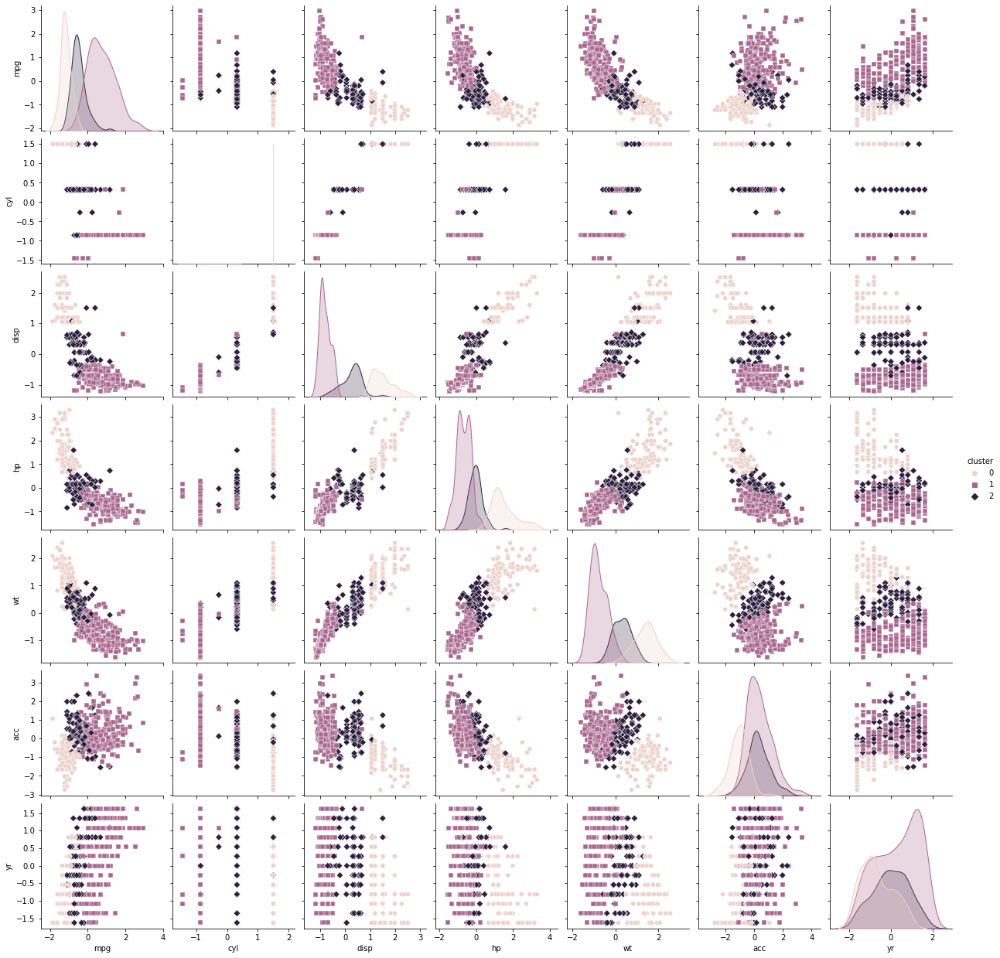

In [138]:
sns.pairplot(scaled_df,diag_kind='kde', hue='cluster', markers=["o", "s", "D"])

In [256]:
# importing the StandardScaler Module
from sklearn.preprocessing import StandardScaler
X = StandardScaler()

In [258]:
car_new.head(5)

,car_name,mpg,cyl,disp,hp,wt,acc,yr,origin,cluster
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,70,1,0
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,70,1,0
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,70,1,0
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,70,1,0
4,ford torino,17.0,8,302.0,140.0,3449,10.5,70,1,0


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> G.Pass a new DataPoint and predict which cluster it belongs to. [2 Marks]


### 3 data points  are created for each cluster and scaled to the zscore before predicting

In [144]:

# Import pandas library
import pandas as pd
 
# initialize list of lists
data = [[17.0,8,302.0,140.0,3449,10.5,70], [26.0,4,97.0,46.0,183,20.5,73],[21.0,6,200.0,85.0,2587,16.0,74]]
 
# Create the pandas DataFrame
df = pd.DataFrame(data, columns = ['mpg','cyl','disp','hp','wt','acc','yr'])
df.head()
scaled_data=df.apply(zscore)
scaled_data.head()
prediction = final_model.predict(scaled_data)
print(prediction)

[0 1 2]


**Comments**<br>
The three data point fed into the model and able to predict the cluster appropriately.<br>

**Cluster definition as follows**<br>
**Cluster 0:** Heavy weighted cars with more number of (8) cylinders with highest horse power, and less miles per gallon <br>
**Cluster 1:** Lowest weighed cars with less number of cylinders, least horse power and most miles per gallon<br>
**Cluster 2:** Medium weighed cars with medium number of cylinders, average horse power and medium miles per gallon<br>


The heavy weighted cluster 3449, with 8 cylinders is predicted as **0[Heavy weighted]** cluster  <br>
the data has 183 with 4 cylinders predicted as cluster **1[Small or low weighted car]** <br>
the data has weight with 2587 and 6 cylinders is grouped as **cluster 2[Medium sized]** car

## Conclusion

 K-means Clustering is applied to the Car Dataset to and it is segmented  into 3 clear categories.The categorized are well seperated through Kmeans<br>
And its been observed each category is different in terms of weight, number of cylinders, horsepower and miles per gallon.


 <span style="font-family: Arial; font-weight:bold;font-size:2.5em;color:#00b3e5;">PART B

**DOMAIN:** Automobile<br>
**• CONTEXT:**The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The
vehicle may be viewed from one of many different angles.<br>

**• DATA DESCRIPTION:** The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were
used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles
was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to
distinguish between the cars.<br>
• All the features are numeric i.e. geometric features extracted from the silhouette.<br>

**• PROJECT OBJECTIVE:** Apply dimensionality reduction technique – PCA and train a model and compare relative results.


 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">1. Data Understanding & Cleaning: [5 Marks]

 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">A. Read ‘vehicle.csv’ and save as DataFrame. [1 Marks]


In [67]:
# import necessary libraries
import pandas as pd
from sklearn.cluster import KMeans 
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.decomposition import PCA

In [68]:
vehicle_df = pd.read_csv('vehicle.csv')  # import the csv file
vehicle_df.head(5)


,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [69]:
class DataAnalyser:
    
    """
    Class used ot Analyse the Data

    ...

    Attributes
    ----------
    data : data
        The name of the data frame for which analysis will Happen
    
    Methods
    -------
    analyseShape()
        Prints the shaope of the data, number of row and columns
    findIfNullColumns()
        Finds the percentage of null columns and prints it
    checkDataTypes()
        prints the dataTypes of each column
    check5PointSummary()
        prints 5 pointSummary
    findCategoricalData()
        Finds the categorical columns in a dataset
    printCategoricalData
        Print categorical columns in a dataset
    findNumericalData
        Prints the Numerical Data
    convertdataType
        Convert the object to Numberical
    convertObjectsToCategorical
         convert objects to categorical
    findColumnsToDrop
        Find columns to Drop
    findNumericalValuesInObject
         Find Numberical Values in object data
    """
    
    #class Constructor 
    def __init__(self, data ):
        self.data=data
    
    
    ## Method to find the shape of data
    def analyseShape(self,data):
        print("Details of Data features")
        print("---------------------------")
        print('The number of rows in the data',data.shape[0])
        print('The number of features in the data',data.shape[1])
        print("Feature Names")
        print("----------------")
        print(data.columns)
    
    ## Method to find the percentage of null columns    
    def findIfNullColumns(self,data):
        print("Percentage of Null Values")
        print("--------------------------")
        percent_missing = data.isnull().sum() * 100 / len(data)
        missing_value_data = pd.DataFrame({'Feature Name': data.columns,
                                 'percent_missing': percent_missing})
        print(missing_value_data)
     
    ## Method to check the data types of The data frame
    def checkDataTypes(self,data):
            print("Data types of all the features")
            print("-------------------------------")
            print(data.dtypes)
    
    ## Method to Print the 5 Point Summary
    def check5PointSummary(self,data):
        print("5 point summary of the data")
        print("------------------------------")
        print(data.describe().T)
        
    
    # This function would return all the categorical variables of a dataset
    def findCategoricalData(self,data):
        categorical_cols=data.select_dtypes(exclude=[np.number]).columns
        return categorical_cols
    
    # This function would Print all the categorical variables of a dataset
    def printCategoricalData(self,data):
        print("Categorical Columns")
        print("---------------------")
        categorical_cols=data.select_dtypes(exclude=[np.number]).columns
        print(categorical_cols)
    
    # This function would return all the Numerical variables of a dataset
    def findNumericalData(self,data):
        numerical_cols=data.select_dtypes(include=[np.number]).columns
        return numerical_cols
    
    # This function would print all the Numerical variables of a dataset
    def printNumericalData(self,data):
         print("Numerical Columns")
         print("---------------------")
         numerical_cols=data.select_dtypes(include=[np.number]).columns
         print(numerical_cols)
       
    #converting the data type from one data type to another
    @staticmethod
    def convertdataType(data,columnName,fromType,toType):
       # If ‘coerce’, then invalid parsing will be set as NaN.
        print('datatype before conversion', data[columnName].dtype)
        data[columnName]=pd.to_numeric(data[columnName], errors='coerce')
        print('datatype after conversion', data[columnName].dtype)
        
    ## Method to convert objects to categorical Values
    @staticmethod
    def convertObjectsToCategorical(data):
        for feature in data.columns: # Loop through all columns in the dataframe
            if data[feature].dtype == 'object': # Only apply for columns with categorical strings
                data[feature] = pd.Categorical(data[feature])# Replace strings with an integer
            data.head(5)
            return data;
        
    ## Method to find the column which has to be dropped
    ## This method will identify the index / identifier values in a dataset which will not be useful for model building
    @staticmethod
    def findColumnsToDrop(data):
        list_of_cols = list(data.select_dtypes(['object']).columns)
        print("The features that are not helpful for model building")
        print("-----------------------------------------------------")
        dropcolumns=[]
        for cols in list_of_cols:
            var = (data[cols].nunique() - len(data[cols]))* 100 / len(data[cols])
            if (abs(var) == 0):
                 dropcolumns=cols       
         
        return dropcolumns
    
    ## This method would find number of columns having the continuous data in the Object
    
    @staticmethod
    def findNumericalValuesInObject(data):
        numericalColumn=[]
        for feature in data.columns: # Loop through all columns in the dataframe
            
            if data[feature].dtype == 'object': # Only apply for columns with categorical strings
                       # data[feature] = pd.Categorical(data[feature])# Replace strings with an integer
                    #print(data[feature].value_counts())
                  percentage=data[feature].nunique()/len(data[feature])*100
                  if(abs(percentage)==100):
                        print('features having values 100',feature)
                  elif(abs(percentage)>=90):
                        print('features more than 90',feature)
                        numericalColumn=feature
                  else:
                    pass
        return numericalColumn
    

### Class DataVisualizer has the methods to Visualize the data in form of Graphs and charts¶

In [70]:
class DataVisualizer:
    
    """
    Class used to do Visualization of Data

    ...

    Methods
    -------
    plotCorrelation()
        to plot the correlation values
    plotBoxPlotData()
        To plot the Box Plot
    plotCountPlot()
        To plot the count Plot
    plotPairPlot()
         To plot pair plot
         
    """
    def plotCorrelation(self):
        # Correlation matrix for all variables
        corr = data.corr()

        mask = np.zeros_like(corr, dtype = np.bool)
        mask[np.triu_indices_from(mask)] = True

        f, ax = plt.subplots(figsize = (11, 9))

        cmap = sns.diverging_palette(220, 10, as_cmap = True)
        #sns.heatmap(data.corr(), center=0, cmap='mako', annot=True, fmt='.2f', linewidths=0.05)
        sns.heatmap(corr, mask = mask, cmap = cmap, square = True, linewidths = .5, annot=True, cbar_kws = {"shrink": .5})#, annot = True)
        ax.set_title('Correlation Matrix of Data')
        
    def plotBoxPlotData(self):
        fig = plt.figure(figsize =(10, 7))
        plot_data= data.select_dtypes(exclude=['category','object'])
 
        # Creating plot
        plt.boxplot(plot_data)
        plt.title('Box Plot for Vehicle')
       
        # show plot
        plt.show()
        
    def plotCountPlot(self,targetVariable):
        # count plot on single categorical variable
        sns.countplot(x =targetVariable, data = data)
        plt.title("Count Plot for the Target variable"+targetVariable)
        # Show the plot
        plt.show()
        
    def plotPairPlot(self,dataName,targetVariable):
        sns.pairplot(data, hue = targetVariable, diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'}
             )
        # Title 
        plt.suptitle('Pair Plot of '+dataName, 
             size = 24);
        
    def buildPieChart(self):
        colors = sns.color_palette('pastel')[0:5]
        dataAnalyser = DataAnalyser(data)
        categoricalColumns=dataAnalyser.findCategoricalData(data)
        print('Pie chart for all categorical Columns')
       # print(categoricalColumns)
        for col in data[categoricalColumns]:
            #n = data[col].nunique()
            #activities = np.arange(n)
            #slices = np.arange(n)        
            #patches, texts = plt.pie(slices,colors=colors,startangle=90,labels=slices)
            #labels = ['{0} - {1:1.2f} %'.format(i, j) for i, j in zip(activities,100.*slices/slices.sum())]
            plt.title("Pie chart for "+ col)
            #plt.legend(patches, labels, loc='center left', bbox_to_anchor=(-0.35, .5), fontsize=8)
            data[col].value_counts().plot.pie(autopct='%1.2f%%',shadow=True, colors=colors)
            plt.show()
    

### PreProcessor Class do all the necessary work for Model building

In [71]:
class Preprocessor:
    
    """
    Class have the methods to invoke the methods of DataAnalyser, DataTransformer and Datavisualizer
    helps in invoking all the methods in sequence

    ...

    Methods
    -------
    analyseData()
        invokes all the methods of DataAnalyser in sequence
    visualizeData()
        invokes all the methods of DataVisualizer in sequence
    transformData()
        Invokes the default transformation requirement for a dataset
    encodeData()
         Transforms all categorical values to numerical for model building
         
    """
    def analyseData(self,data):
        dataAnalyser=DataAnalyser(data)
        dataAnalyser.findIfNullColumns(data)
        dataAnalyser.analyseShape(data)
        dataAnalyser.checkDataTypes(data)
        dataAnalyser.check5PointSummary(data)
        dataAnalyser.printCategoricalData(data)
        dataAnalyser.printNumericalData(data)
        self.columnsToDrop=dataAnalyser.findColumnsToDrop(data)
        self.objectColumnsHaveNumeric=dataAnalyser.findNumericalValuesInObject(data)
        print("columnsToDrop",self.columnsToDrop,'\nobjectColumnsHaveNumeric',self.objectColumnsHaveNumeric)
    
     # Method to call all the visualization options 
    def visualizeData(self,data):
        dataVisualizer = DataVisualizer()
        #dataVisualizer.plotCorrelation()
        dataVisualizer.plotBoxPlotData()
        targetVariable=''
        targetVariable=targetVariable.join(data.iloc[:,-1:].columns.values)
        print(targetVariable)
        dataVisualizer.plotCountPlot(targetVariable)
        dataVisualizer.buildPieChart()
        dataVisualizer.plotPairPlot('Customer churn',targetVariable)

In [73]:
preprocessor=Preprocessor()
preprocessor.analyseData(vehicle_df)
data=vehicle_df

Percentage of Null Values
--------------------------
                                            Feature Name  percent_missing
compactness                                  compactness         0.000000
circularity                                  circularity         0.591017
distance_circularity                distance_circularity         0.472813
radius_ratio                                radius_ratio         0.709220
pr.axis_aspect_ratio                pr.axis_aspect_ratio         0.236407
max.length_aspect_ratio          max.length_aspect_ratio         0.000000
scatter_ratio                              scatter_ratio         0.118203
elongatedness                              elongatedness         0.118203
pr.axis_rectangularity            pr.axis_rectangularity         0.354610
max.length_rectangularity      max.length_rectangularity         0.000000
scaled_variance                          scaled_variance         0.354610
scaled_variance.1                      scaled_variance.1   

### Observation
1.There are 846 Observations (Rows) and 19 Attributes (Columns) in vehicle dataset<br>
2.Number of features has null values <br>
3.All features are numerical data type except class which is Object type and its categorical.

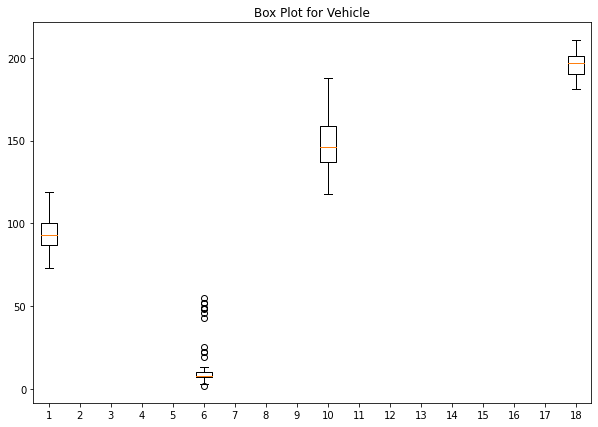

class


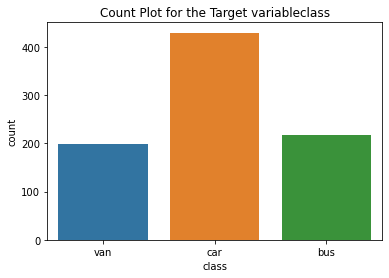

Pie chart for all categorical Columns


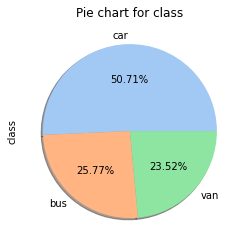

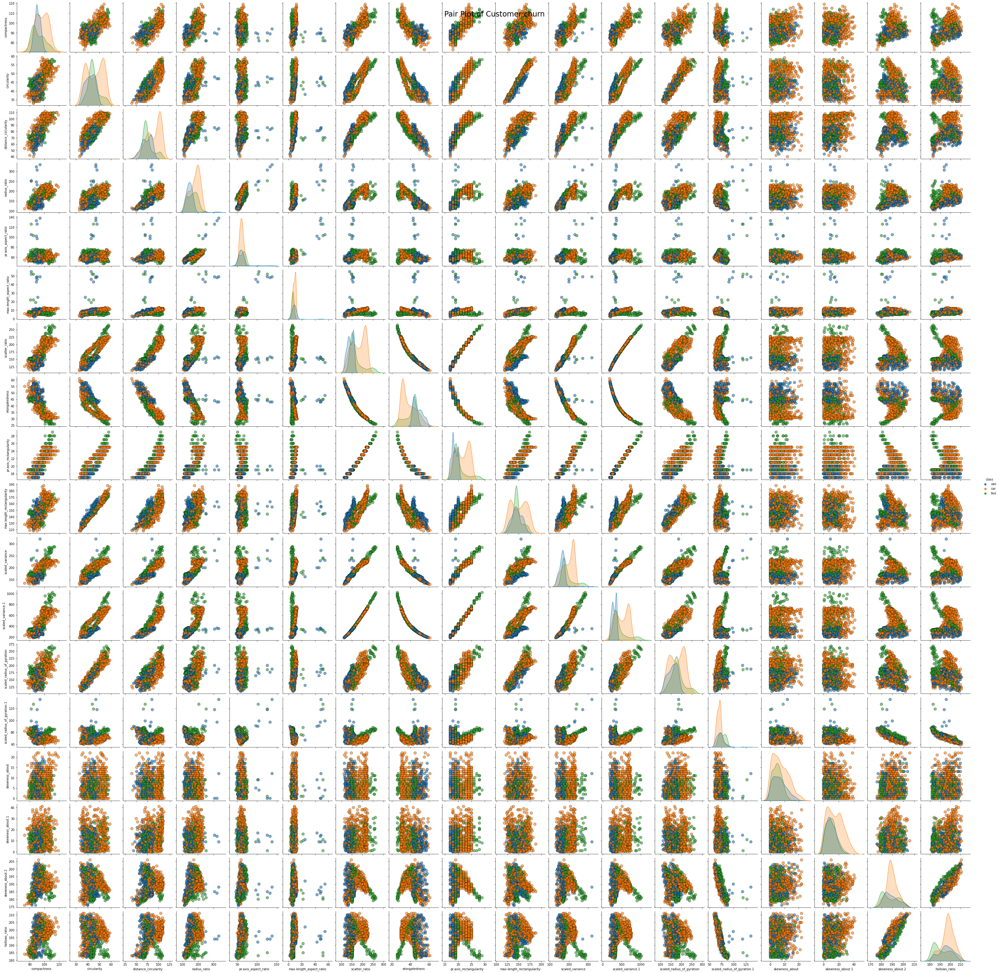

In [74]:
preprocessor.visualizeData(vehicle_df)

### Observation
1.There are 3 types of classes, van, car and bus. And Car is 50% and bus and van holds approximately 25% each of whole data<br>
2. Pair plot shows there are number of features are similar and has more correlation by visualizing.For example the features in columns (1-compactness,2-circularity,10-max.length_rectangularity,14-scaled_radius_of_gyration) are highly correlated with each other<br>.
* Having all the features in the model buiding might not add value.<br>
* Hence its clearly visible that even, there are multiple dimensions are available for this data set, dimension reduction is possible<br>
* by applying PCA and to use only principle components that has high correlation.

### Outlier Detection

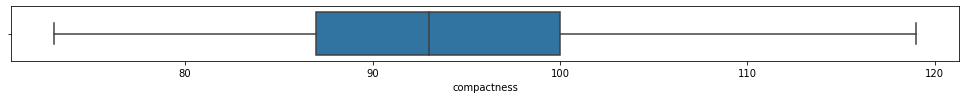

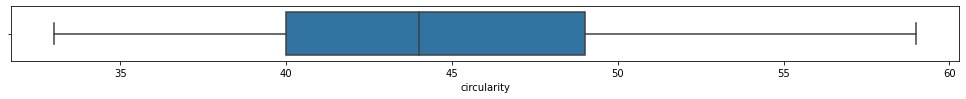

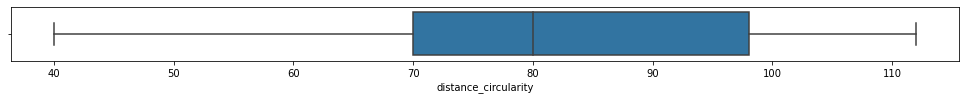

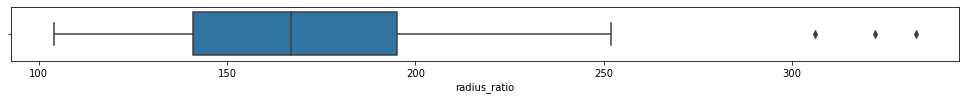

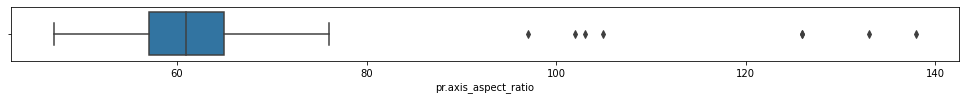

...

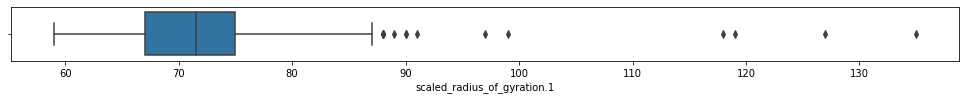

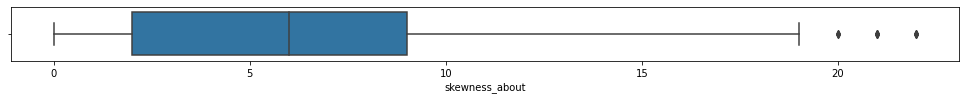

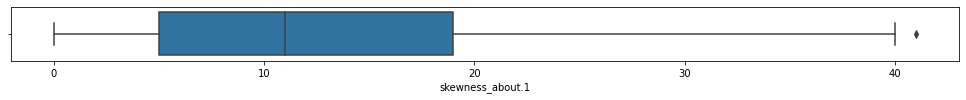

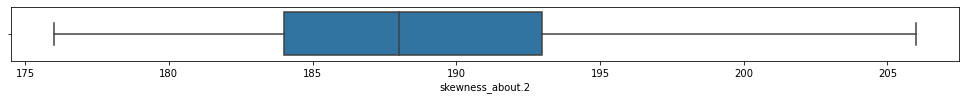

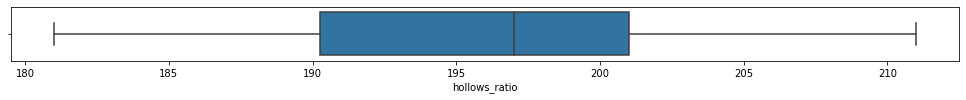

In [76]:
import matplotlib.pyplot as plt
vehicle_df1=vehicle_df.select_dtypes(exclude=['object'])

for column in vehicle_df1:
        plt.figure(figsize=(17,1))
        sns.boxplot(data=vehicle_df1, x=column)

**Observation:**

* There are outliers present for features radius_ratio, pr.axis_aspect_ratio,max.length_aspect_ratio,scaled_variance,scaled_variance_1,scaled_radius_of_gyration.1, skewness_about,skewness_about.1.<br>
* Among them  pr.axis_aspect_ratio, max.length_aspect_ratio,scaled_radius_of_gyration.1 have more outliers

 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> B. Check percentage of missing values and impute with correct approach. [1 Marks]

In [20]:
import pandas as pd
from sklearn.cluster import KMeans 
import matplotlib.pyplot as plt
import seaborn as sns

In [79]:
## Method to find the percentage of null columns    
def findIfNullColumns(data):
    print("Percentage of Null Values")
    print("--------------------------")
    print("The Total number of data",len(data))
    percent_missing = data.isnull().sum() * 100 / len(data)
    missing_value_data = pd.DataFrame({'Null Count': data.isnull().sum(),
                               'percent_missing': percent_missing})
    print(missing_value_data)

In [80]:
findIfNullColumns(vehicle_df)

Percentage of Null Values
--------------------------
The Total number of data 846
                             Null Count  percent_missing
compactness                           0         0.000000
circularity                           5         0.591017
distance_circularity                  4         0.472813
radius_ratio                          6         0.709220
pr.axis_aspect_ratio                  2         0.236407
max.length_aspect_ratio               0         0.000000
scatter_ratio                         1         0.118203
elongatedness                         1         0.118203
pr.axis_rectangularity                3         0.354610
max.length_rectangularity             0         0.000000
scaled_variance                       3         0.354610
scaled_variance.1                     2         0.236407
scaled_radius_of_gyration             2         0.236407
scaled_radius_of_gyration.1           4         0.472813
skewness_about                        6         0.709220
skewne

**Observation:**<br>
* circularity,distance_circularity ,radius_ratio,pr.axis_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,scaled_variance, scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1.skewness_about,skewness_about.1 and skewness_about.2 has missing values.      
* Only 5 columns do not have null values. All other features have few null values

## Imputing the missing values

In [85]:
vehicle_df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


**Comments:** As all are numerical values trying to impute with median, So verifying the median value

In [86]:
vehicle_df.median()

compactness                     93.0
circularity                     44.0
distance_circularity            80.0
radius_ratio                   167.0
pr.axis_aspect_ratio            61.0
max.length_aspect_ratio          8.0
scatter_ratio                  157.0
elongatedness                   43.0
pr.axis_rectangularity          20.0
max.length_rectangularity      146.0
scaled_variance                179.0
scaled_variance.1              363.5
scaled_radius_of_gyration      173.5
scaled_radius_of_gyration.1     71.5
skewness_about                   6.0
skewness_about.1                11.0
skewness_about.2               188.0
hollows_ratio                  197.0
dtype: float64

In [87]:
vehicle_df.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


Comments: 
As the data has all continuous numerical value, planning to impute with the Median

In [257]:
# 1. Remove categorial 
#vehicle_df_new = vehicle_df.select_dtypes(exclude=   
               #  ["object"]).copy()
vehicle_df_new = vehicle_df.copy()

In [258]:
vehicle_df_new.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

In [259]:
vehicle_df_new.iloc[:,:-1].head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183


In [260]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='median')
imputer = imputer.fit(vehicle_df_new.iloc[:,:-1])
vehicle_df_new.iloc[:,:-1] = imputer.transform(vehicle_df_new.iloc[:,:-1])
vehicle_df_new.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95.0,48.0,83.0,178.0,72.0,10.0,162.0,42.0,20.0,159.0,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197.0,van
1,91.0,41.0,84.0,141.0,57.0,9.0,149.0,45.0,19.0,143.0,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199.0,van
2,104.0,50.0,106.0,209.0,66.0,10.0,207.0,32.0,23.0,158.0,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196.0,car
3,93.0,41.0,82.0,159.0,63.0,9.0,144.0,46.0,19.0,143.0,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207.0,van
4,85.0,44.0,70.0,205.0,103.0,52.0,149.0,45.0,19.0,144.0,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183.0,bus


In [261]:
findIfNullColumns(vehicle_df_new)

Percentage of Null Values
--------------------------
The Total number of data 846
                             Null Count  percent_missing
compactness                           0              0.0
circularity                           0              0.0
distance_circularity                  0              0.0
radius_ratio                          0              0.0
pr.axis_aspect_ratio                  0              0.0
max.length_aspect_ratio               0              0.0
scatter_ratio                         0              0.0
elongatedness                         0              0.0
pr.axis_rectangularity                0              0.0
max.length_rectangularity             0              0.0
scaled_variance                       0              0.0
scaled_variance.1                     0              0.0
scaled_radius_of_gyration             0              0.0
scaled_radius_of_gyration.1           0              0.0
skewness_about                        0              0.0
skewne

### Comments:
* As all the features are numerical , the missing values are imputed. As outliers are observed, imputed with Median rather than mean which will not be affected by Outliers.
* Verified whether all the null values are replaced by printing the percentage again.

 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">  C. Visualize a Pie-chart and print percentage of values for variable ‘class’. [2 Marks]

In [262]:
def buildPieChart(data):
    colors = sns.color_palette('pastel')[0:5]
    categoricalColumns=findCategoricalData(data)
   # print(categoricalColumns)
    for col in data[categoricalColumns]:
        if (col=='customerID'):
            print(' customerID is Excluded for piechart')
        else:
            plt.title("Pie chart for "+ col)
            data[col].value_counts().plot.pie(autopct='%1.2f%%',shadow=True, colors=colors)
            plt.show()
    

In [263]:
# This function would return all the categorical variables of a dataset
import numpy as np
def findCategoricalData(data):
    categorical_cols=data.select_dtypes(exclude=[np.number]).columns
    return categorical_cols

In [264]:
findCategoricalData(vehicle_df_new)

Index(['class'], dtype='object')

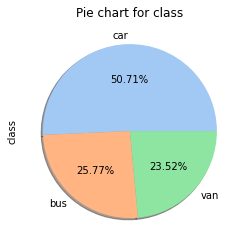

In [265]:
buildPieChart(vehicle_df_new)

**Comments**<br>
There are 3 classes found Car, van and Bus. And more than 50% is car and 26% of Buses and 24% of Cars available in this dataset


 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">  D. Check for duplicate rows in the data and impute with correct approach. [1 Marks]

In [266]:
vehicle_df_new.duplicated().sum()

0

**Comments:**
There are no duplicates found in this dataset

 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">2. Data Preparation: [2 Marks]


 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> A. Split data into X and Y. [Train and Test optional] [1 Marks]


In [267]:
from sklearn.model_selection import train_test_split
# Split data into X and Y
# Create a separate dataframe consisting only of the features i.e independent attributes
X = vehicle_df_new.drop(labels= "class" , axis = 1)
y = vehicle_df_new["class"]
X.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,95.0,48.0,83.0,178.0,72.0,10.0,162.0,42.0,20.0,159.0,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197.0
1,91.0,41.0,84.0,141.0,57.0,9.0,149.0,45.0,19.0,143.0,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199.0
2,104.0,50.0,106.0,209.0,66.0,10.0,207.0,32.0,23.0,158.0,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196.0
3,93.0,41.0,82.0,159.0,63.0,9.0,144.0,46.0,19.0,143.0,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207.0
4,85.0,44.0,70.0,205.0,103.0,52.0,149.0,45.0,19.0,144.0,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183.0


 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> B. Standardize the Data. [1 Marks]

In [268]:
# convert the features into z scores as we do not know what units / scales were used and store them in new dataframe
# It is always adviced to scale numeric attributes in models that calculate distances.
from scipy.stats import zscore
XScaled  = X.apply(zscore)  # convert all attributes to Z scale 
XScaled.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,5.572112e-16,1.000592,-2.512695,-0.811520,-0.082445,0.768143,3.076880
circularity,846.0,-1.018361e-16,1.000592,-1.928651,-0.786846,-0.134387,0.681188,2.312338
distance_circularity,846.0,2.370051e-16,1.000592,-2.676060,-0.769150,-0.133514,1.010632,1.900523
radius_ratio,846.0,8.871286e-17,1.000592,-1.943427,-0.835032,-0.056160,0.782625,4.916638
pr.axis_aspect_ratio,846.0,3.732239e-16,1.000592,-1.863187,-0.593753,-0.085979,0.421794,9.688661
max.length_aspect_ratio,846.0,-2.036721e-16,1.000592,-1.428157,-0.340845,-0.123383,0.311542,10.097349
scatter_ratio,846.0,-4.391024e-16,1.000592,-1.714617,-0.659704,-0.358300,0.877456,2.896861
elongatedness,846.0,-8.582575e-17,1.000592,-1.913112,-1.016511,0.264347,0.648605,2.569893
pr.axis_rectangularity,846.0,-4.320159e-16,1.000592,-1.383974,-0.610886,-0.224342,0.935290,3.254554
max.length_rectangularity,846.0,7.968409e-16,1.000592,-2.067876,-0.758169,-0.137782,0.758332,2.757358


In [269]:
# Split X and y into training and test set in 80:20 ratio
X_train, X_test, y_train, y_test = train_test_split(XScaled, y, test_size=0.20, random_state=42)

In [270]:
display(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(676, 18)

(170, 18)

(676,)

(170,)


 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">3. Model Building: [13 Marks]

 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">A. Train a base Classification model using SVM. [1 Marks]

In [271]:
#Import svm model
from sklearn import svm

#Create a svm Classifier
clf = svm.SVC(kernel='linear') # Linear Kernel

#Train the model using the training sets
clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

**Evaluating the Model**<br>
Let's estimate how accurately the classifier or model can predict the class<br>
Accuracy can be computed by comparing actual test set values and predicted values<br>

 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> B. Print Classification metrics for train data. [1 Marks]

In [272]:
#Import the Required Libraries for Classification metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

## Classification Metrics for Train Data

In [273]:
print('SVM classifier Scores after Scaling without Hyperparameter Tuning\n\n')
print('SVM classifier for train data: {0:.3f}'.format(clf.score(X_train, y_train)))

#y_train_true, y_train_pred = y_train, clf.predict(X_train)

y_train_pred = clf.predict(X_train)

# Classification Report
print('\n{}'.format(classification_report(y_train, y_train_pred)))

# Confusion Matrix
cm = confusion_matrix(y_train, y_train_pred)
print('\nConfusion Matrix for Train Data:\n', cm)

# Accuracy Score
auc = accuracy_score(y_train, y_train_pred)
print('\nAccuracy Score:\n', auc.round(3))

SVM classifier Scores after Scaling without Hyperparameter Tuning


SVM classifier for train data: 0.964

              precision    recall  f1-score   support

         bus       0.94      0.96      0.95       166
         car       0.98      0.96      0.97       351
         van       0.97      0.97      0.97       159

    accuracy                           0.96       676
   macro avg       0.96      0.97      0.96       676
weighted avg       0.96      0.96      0.96       676


Confusion Matrix for Train Data:
 [[160   5   1]
 [  9 338   4]
 [  2   3 154]]

Accuracy Score:
 0.964


Confusion Matrix


<AxesSubplot:>

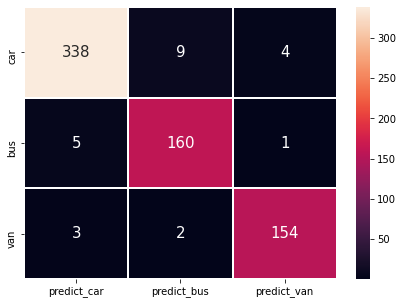

In [274]:
# calculate accuracy measures and confusion matrix
from sklearn import metrics

print("Confusion Matrix")
cm=metrics.confusion_matrix(y_train, y_train_pred, labels=["car","bus","van"])
df_cm = pd.DataFrame(cm, index = [i for i in ["car","bus","van"]],
                  columns = [i for i in ["predict_car","predict_bus","predict_van"]])
plt.figure(figsize = (7,5))

#sns.heatmap(df_cm, annot=True,linewidths=2, linecolor='white', fmt='g', annot_kws={"size":15}) 
sns.heatmap(df_cm, annot=True, fmt='g',linewidths=1,linecolor='white', annot_kws={'size':15})

### Observation:

The Accuracy score is 0.96 for Train Data

## Classification metrics for test Data

In [275]:
print('SVM classifier Scores after Scaling without Hyperparameter Tuning\n\n')
print('SVM classifier accuracy for test data: {0:.3f}'.format(clf.score(X_test, y_test)))

y_pred =clf.predict(X_test)

# Classification Report
print('\n{}'.format(classification_report(y_test, y_pred)))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
print('\nConfusion Matrix for Test Data:\n', cm)

# Accuracy Score
auc = accuracy_score(y_test, y_pred)
print('\nAccuracy Score:\n', auc.round(3))


SVM classifier Scores after Scaling without Hyperparameter Tuning


SVM classifier accuracy for test data: 0.935

              precision    recall  f1-score   support

         bus       0.91      0.94      0.92        52
         car       0.96      0.91      0.93        78
         van       0.93      0.97      0.95        40

    accuracy                           0.94       170
   macro avg       0.93      0.94      0.94       170
weighted avg       0.94      0.94      0.94       170


Confusion Matrix for Test Data:
 [[49  2  1]
 [ 5 71  2]
 [ 0  1 39]]

Accuracy Score:
 0.935


Confusion Matrix


<AxesSubplot:>

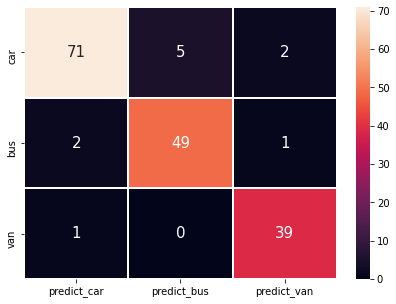

In [276]:
# calculate accuracy measures and confusion matrix
from sklearn import metrics

print("Confusion Matrix")
cm=metrics.confusion_matrix(y_true, y_pred, labels=["car","bus","van"])
df_cm = pd.DataFrame(cm, index = [i for i in ["car","bus","van"]],
                  columns = [i for i in ["predict_car","predict_bus","predict_van"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g',linewidths=1,linecolor='white', annot_kws={'size':15})

### Observation:
The train data accuracy is 0.96 where as test data accuracy is 0.93 and its overfitting

 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> C. Apply PCA on the data with 10 components. [3 Marks]

In [277]:
covMatrix = np.cov(XScaled,rowvar=False)
print(covMatrix)

[[ 1.00118343  0.68569786  0.79086299  0.69055952  0.09164265  0.14842463
   0.81358214 -0.78968322  0.81465658  0.67694334  0.76297234  0.81497566
   0.58593517 -0.24988794  0.23635777  0.15720044  0.29889034  0.36598446]
 [ 0.68569786  1.00118343  0.79325751  0.6216467   0.15396023  0.25176438
   0.8489411  -0.82244387  0.84439802  0.96245572  0.79724837  0.83693508
   0.92691166  0.05200785  0.14436828 -0.01145212 -0.10455005  0.04640562]
 [ 0.79086299  0.79325751  1.00118343  0.76794246  0.15864319  0.26499957
   0.90614687 -0.9123854   0.89408198  0.77544391  0.86253904  0.88706577
   0.70660663 -0.22621115  0.1140589   0.26586088  0.14627113  0.33312625]
 [ 0.69055952  0.6216467   0.76794246  1.00118343  0.66423242  0.45058426
   0.73529816 -0.79041561  0.70922371  0.56962256  0.79435372  0.71928618
   0.53700678 -0.18061084  0.04877032  0.17394649  0.38266622  0.47186659]
 [ 0.09164265  0.15396023  0.15864319  0.66423242  1.00118343  0.64949139
   0.10385472 -0.18325156  0.07969

In [278]:
pca = PCA(n_components=10)
pca.fit(XScaled)

PCA(n_components=10)

### Eigen Values

In [279]:
print(pca.explained_variance_)

[9.40460261 3.01492206 1.90352502 1.17993747 0.91726063 0.53999263
 0.35887012 0.22193246 0.1606086  0.09185722]


In [280]:
print(pca.components_)

[[ 2.75283688e-01  2.93258469e-01  3.04609128e-01  2.67606877e-01
   8.05039890e-02  9.72756855e-02  3.17092750e-01 -3.14133155e-01
   3.13959064e-01  2.82830900e-01  3.09280359e-01  3.13788457e-01
   2.72047492e-01 -2.08137692e-02  4.14555082e-02  5.82250207e-02
   3.02795063e-02  7.41453913e-02]
 [-1.26953763e-01  1.25576727e-01 -7.29516436e-02 -1.89634378e-01
  -1.22174860e-01  1.07482875e-02  4.81181371e-02  1.27498515e-02
   5.99352482e-02  1.16220532e-01  6.22806229e-02  5.37843596e-02
   2.09233172e-01  4.88525148e-01 -5.50899716e-02 -1.24085090e-01
  -5.40914775e-01 -5.40354258e-01]
 [-1.19922479e-01 -2.48205467e-02 -5.60143254e-02  2.75074211e-01
   6.42012966e-01  5.91801304e-01 -9.76283108e-02  5.76484384e-02
  -1.09512416e-01 -1.70641987e-02  5.63239801e-02 -1.08840729e-01
  -3.14636493e-02  2.86277015e-01 -1.15679354e-01 -7.52828901e-02
   8.73592034e-03  3.95242743e-02]
 [ 7.83843562e-02  1.87337408e-01 -7.12008427e-02 -4.26053415e-02
   3.27257119e-02  3.14147277e-02 -9.

### Percentage variation in each Eigen vector

In [281]:
print(pca.explained_variance_ratio_)

[0.52186034 0.16729768 0.10562639 0.0654746  0.05089869 0.02996413
 0.01991366 0.01231501 0.00891215 0.00509715]


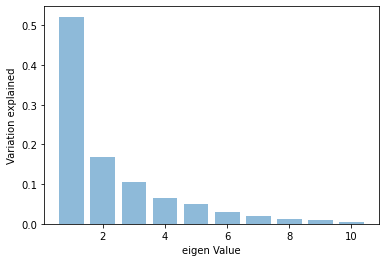

In [282]:
plt.bar(list(range(1,11)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> D. Visualize Cumulative Variance Explained with Number of Components. [2 Marks]

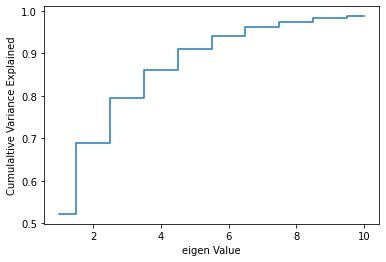

In [283]:
plt.step(list(range(1,11)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cumulaltive Variance Explained')
plt.xlabel('eigen Value')
plt.show()

 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> E. Draw a horizontal line on the above plot to highlight the threshold of 90%. [1 Marks]

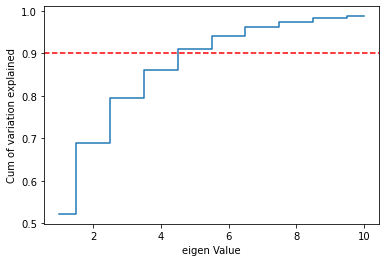

In [284]:
plt.step(list(range(1,11)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.axhline(y = 0.9, color = 'r', linestyle = 'dashed')    
plt.show()
# line colour is red


 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> F. Apply PCA on the data. This time Select Minimum Components with 90% or above variance explained. [2 Marks]

In [285]:
## Apply with 5 components
pca = PCA(n_components=5)
pca.fit(XScaled)

PCA(n_components=5)

In [286]:
print(pca.explained_variance_)

[9.40460261 3.01492206 1.90352502 1.17993747 0.91726063]


In [287]:
print(pca.components_)

[[ 2.75283688e-01  2.93258469e-01  3.04609128e-01  2.67606877e-01
   8.05039890e-02  9.72756855e-02  3.17092750e-01 -3.14133155e-01
   3.13959064e-01  2.82830900e-01  3.09280359e-01  3.13788457e-01
   2.72047492e-01 -2.08137692e-02  4.14555082e-02  5.82250207e-02
   3.02795063e-02  7.41453913e-02]
 [-1.26953763e-01  1.25576727e-01 -7.29516436e-02 -1.89634378e-01
  -1.22174860e-01  1.07482875e-02  4.81181371e-02  1.27498515e-02
   5.99352482e-02  1.16220532e-01  6.22806229e-02  5.37843596e-02
   2.09233172e-01  4.88525148e-01 -5.50899716e-02 -1.24085090e-01
  -5.40914775e-01 -5.40354258e-01]
 [-1.19922479e-01 -2.48205467e-02 -5.60143254e-02  2.75074210e-01
   6.42012966e-01  5.91801304e-01 -9.76283108e-02  5.76484384e-02
  -1.09512416e-01 -1.70641987e-02  5.63239801e-02 -1.08840729e-01
  -3.14636493e-02  2.86277015e-01 -1.15679354e-01 -7.52828901e-02
   8.73592034e-03  3.95242743e-02]
 [ 7.83843562e-02  1.87337408e-01 -7.12008427e-02 -4.26053416e-02
   3.27257120e-02  3.14147277e-02 -9.

In [288]:
print(pca.explained_variance_ratio_)

[0.52186034 0.16729768 0.10562639 0.0654746  0.05089869]


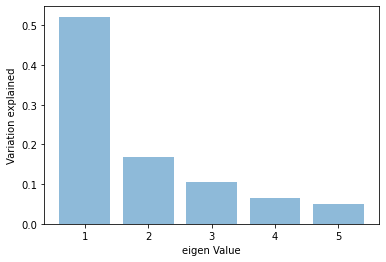

In [289]:
plt.bar(list(range(1,6)),pca.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('eigen Value')
plt.show()

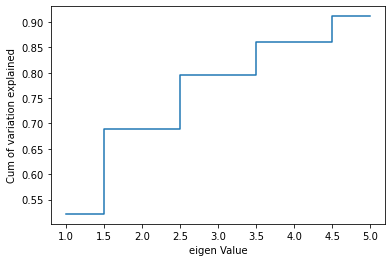

In [290]:
plt.step(list(range(1,6)),np.cumsum(pca.explained_variance_ratio_), where='mid')
plt.ylabel('Cum of variation explained')
plt.xlabel('eigen Value')
plt.show()

In [291]:
from sklearn.decomposition import PCA
#pca = PCA(n_components=2)
principalComponents = pca.fit_transform(XScaled)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2','principal component 3', 'principal component 4','principal component 5'])

In [292]:
principalDf.head()

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,0.334162,-0.219026,1.001584,0.176612,0.079300
1,-1.591711,-0.420603,-0.369034,0.233234,0.693949
2,3.769324,0.195283,0.087859,1.202212,0.731732
3,-1.738598,-2.829692,0.109456,0.376685,-0.362897
4,0.558103,4.758422,11.703647,0.147464,3.256953


In [293]:
finalDf = pd.concat([principalDf, vehicle_df_new[['class']]], axis = 1)

In [294]:
finalDf.head()

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,class
0,0.334162,-0.219026,1.001584,0.176612,0.079300,van
1,-1.591711,-0.420603,-0.369034,0.233234,0.693949,van
2,3.769324,0.195283,0.087859,1.202212,0.731732,car
3,-1.738598,-2.829692,0.109456,0.376685,-0.362897,van
4,0.558103,4.758422,11.703647,0.147464,3.256953,bus


 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> G. Train SVM model on components selected from above step. [1 Marks]

In [295]:
# Create a separate dataframe consisting only of the features i.e independent attributes
X = finalDf.drop(labels= "class" , axis = 1)
y = finalDf["class"]
X.head()

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,0.334162,-0.219026,1.001584,0.176612,0.079300
1,-1.591711,-0.420603,-0.369034,0.233234,0.693949
2,3.769324,0.195283,0.087859,1.202212,0.731732
3,-1.738598,-2.829692,0.109456,0.376685,-0.362897
4,0.558103,4.758422,11.703647,0.147464,3.256953


In [296]:

# Split X and y into training and test set in 80:20 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

In [297]:

display(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(676, 5)

(170, 5)

(676,)

(170,)

In [298]:
#Import svm model
from sklearn import svm

#Create a svm Classifier
clf = svm.SVC(kernel='linear') # Linear Kernel

#Train the model using the training sets
clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">H. Print Classification metrics for train data of above model and share insights. [2 Marks]

In [299]:
print('SVM classifier Scores after Scaling without Hyperparameter Tuning\n\n')
print('SVM classifier for train data: {0:.3f}'.format(clf.score(X_train, y_train)))

y_train_pred =clf.predict(X_train)
# Classification Report
print('\n{}'.format(classification_report(y_train, y_train_pred)))

# Confusion Matrix
cm = confusion_matrix(y_train, y_train_pred)
print('\nConfusion Matrix for Train Data:\n', cm)

# Accuracy Score
auc = accuracy_score(y_train, y_train_pred)
print('\nAccuracy Score:\n', auc.round(3))

SVM classifier Scores after Scaling without Hyperparameter Tuning


SVM classifier for train data: 0.683

              precision    recall  f1-score   support

         bus       0.59      0.55      0.57       166
         car       0.76      0.83      0.80       351
         van       0.57      0.50      0.53       159

    accuracy                           0.68       676
   macro avg       0.64      0.63      0.63       676
weighted avg       0.68      0.68      0.68       676


Confusion Matrix for Train Data:
 [[ 91  47  28]
 [ 27 291  33]
 [ 36  43  80]]

Accuracy Score:
 0.683


Confusion Matrix


<AxesSubplot:>

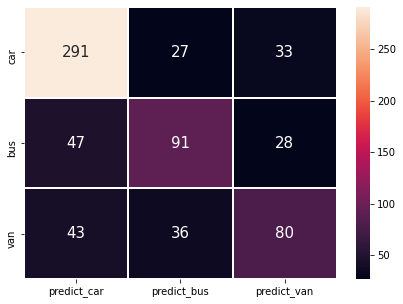

In [300]:
# calculate accuracy measures and confusion matrix
from sklearn import metrics

print("Confusion Matrix")
cm=metrics.confusion_matrix(y_train_true, y_train_pred, labels=["car","bus","van"])
df_cm = pd.DataFrame(cm, index = [i for i in ["car","bus","van"]],
                  columns = [i for i in ["predict_car","predict_bus","predict_van"]])
plt.figure(figsize = (7,5))

#sns.heatmap(df_cm, annot=True,linewidths=2, linecolor='white', fmt='g', annot_kws={"size":15}) 
sns.heatmap(df_cm, annot=True, fmt='g',linewidths=1,linecolor='white', annot_kws={'size':15})

### Insights

The accuracy score before PCA is 0.96 and after PCA is 0.683. After applying PCA, the accuracy score decreased significantly, 

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">4. Performance Improvement: [5 Marks]

<span style="font-family: Arial; font-weight:bold;font-size:1.25em;color:#00b3e5;">A. Train another SVM on the components out of PCA. Tune the parameters to improve performance. [2 Marks]

In [301]:

from sklearn.model_selection import GridSearchCV
#### SVM Model Base
from sklearn.svm import SVC
imp_model = SVC()
imp_model.fit(X_train, y_train)
 
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
 
grid = GridSearchCV(imp_model, param_grid, refit = True, verbose = 3)
 
# fitting the model for grid search
grid.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 2/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 3/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 4/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 5/5] END .....................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV 1/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 2/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 3/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 4/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 5/5] END ...................C=0.1, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 1/5] END ..................C=0.1, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 2/5] END ..................C=0.1, gamma=0.0

[CV 2/5] END ..................C=1000, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 3/5] END ..................C=1000, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 4/5] END ..................C=1000, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 5/5] END ..................C=1000, gamma=0.1, kernel=rbf; total time=   0.0s
[CV 1/5] END .................C=1000, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 2/5] END .................C=1000, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 3/5] END .................C=1000, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 4/5] END .................C=1000, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 5/5] END .................C=1000, gamma=0.01, kernel=rbf; total time=   0.0s
[CV 1/5] END ................C=1000, gamma=0.001, kernel=rbf; total time=   0.0s
[CV 2/5] END ................C=1000, gamma=0.001, kernel=rbf; total time=   0.0s
[CV 3/5] END ................C=1000, gamma=0.001, kernel=rbf; total time=   0.0s
[CV 4/5] END ...............

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             verbose=3)

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> B. Share best Parameters observed from above step. [1 Marks]

In [254]:
# print best parameter after tuning
print(grid.best_params_)
 
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
SVC(C=10, gamma=0.1)


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> C.Print Classification metrics for train data of above model and share relative improvement in performance in all the models along with insights. [2 Marks]

In [302]:
y_train_true, y_train_pred = y_train, grid.predict(X_train)
# Classification Report
print('\n{}'.format(classification_report(y_train_true, y_train_pred)))

# Confusion Matrix
cm = confusion_matrix(y_train_true, y_train_pred)
print('\nConfusion Matrix for Train Data:\n', cm)

# Accuracy Score
auc = accuracy_score(y_train_true, y_train_pred)
print('\nAccuracy Score:\n', auc.round(3))


              precision    recall  f1-score   support

         bus       0.89      0.86      0.88       166
         car       0.92      0.93      0.93       351
         van       0.84      0.84      0.84       159

    accuracy                           0.89       676
   macro avg       0.88      0.88      0.88       676
weighted avg       0.89      0.89      0.89       676


Confusion Matrix for Train Data:
 [[143  14   9]
 [  6 328  17]
 [ 11  14 134]]

Accuracy Score:
 0.895


Confusion Matrix


<AxesSubplot:>

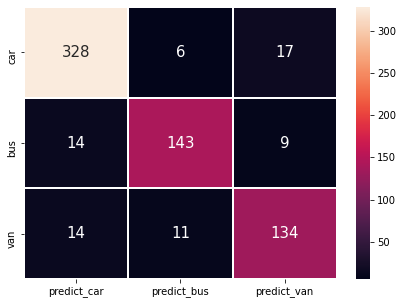

In [256]:
# calculate accuracy measures and confusion matrix
from sklearn import metrics

print("Confusion Matrix")
cm=metrics.confusion_matrix(y_train_true, y_train_pred, labels=["car","bus","van"])
df_cm = pd.DataFrame(cm, index = [i for i in ["car","bus","van"]],
                  columns = [i for i in ["predict_car","predict_bus","predict_van"]])
plt.figure(figsize = (7,5))

#sns.heatmap(df_cm, annot=True,linewidths=2, linecolor='white', fmt='g', annot_kws={"size":15}) 
sns.heatmap(df_cm, annot=True, fmt='g',linewidths=1,linecolor='white', annot_kws={'size':15})

## Insights

* Turns out, based on the confusion matrix above, the accuracy is more (0.895) after parameter Tuning(0.689)on the PCA.<br>
* Hence, the PCA really works well on the data that has high dimensional data and high correlated of variables.Before applying PCA the accuracy score was 0.96 and it got decreased to 0.68 and and now it reached the accuracy as 0.89 which is good accuracy with the performance tuning.
* Hence, the PCA helps in reducing the noise and using only the principle components could get the best accuracy with less dimensions

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">5.Data Understanding & Cleaning: [5 Marks]


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> A. Explain pre-requisite/assumptions of PCA. [2 Marks]

### Pre-requisites

Following are the pre-requisites if we plan to use PCA

*  To reduce the number of variables, but not able to identify variables to completely remove from consideration
*  when the variables are independent of one another.
*  When making the independent variables less interpretablem is not an issue

### Assumptions

PCA is related to the set of operations in the Pearson correlation, so it inherits similar assumptions

**1.PCA assumes a correlation between features.** <br>
If the features (or dimensions or columns, in tabular data) are not correlated, PCA will be unable to determine principal components.<br>
**2.PCA is sensitive to the scale of the features** <br>Imagine we have two features - one takes values between 0 and 1000, while the other takes values between 0 and 1. PCA will be extremely biased towards the first feature being the first principle component, regardless of the actual maximum variance within the data. This is why it’s so important to standardize the values first.<br>
**3.PCA is not robust against outliers.**<br> Similar to the point above, the algorithm will be biased in datasets with strong outliers. This is why it is recommended to remove outliers before performing PCA.<br>
**4.PCA assumes a linear relationship between features** The algorithm is not well suited to capturing non-linear relationships. That’s why it’s advised to turn non-linear features or relationships between features into linear, using the standard methods such as log transforms.<br>
**5.Technical implementations often assume no missing values** When computing PCA using statistical software tools, they often assume that the feature set has no missing values (no empty rows). Be sure to remove those rows and/or columns with missing values, or impute missing values with a close approximation (e.g. the mean of the column).<br>

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">B.Explain advantages and limitations of PCA. [3 Marks]

## Advantages of PCA
**1.** PCA helps in reducing the dimensionality of the Data <br>
**2.** Retains meaningful variation of data. Thus complexity of the data is reduced without compromising the useful information <br>
**3.** PCA helps to generate independent features <br>
**4.** PCA helps in reducing the multicollinearity. When dataset has features that are highly related with each other, single variation is one feature will have impact the other features and lead to reduced precision in the model<br>
**5.** PCA focuses on Retaining the Information on the dataset and also reducing the model complexity <br>

**Advantages PCA in terms of Dimensionality Reduction** <br>
*  Less dimension means less computation or Training time <br>
*  Redundancy removed after removing similar entries <br>
*  space reduced for storing data <br>
*  Makes data easy to plot in 2D and 3D plots <br>
*  Findout significant features and skip rest <br>

## Limitations of PCA

**Low interpretability**: <br>Even the Principal components are linear combinations of the features from the original data, they are not as easy to interpret. For example, it is difficult to tell which are the most important features in the dataset after computing principal components. <br>
**The trade-off between information loss and dimensionality reduction** : <br>Although dimensionality reduction is useful, it comes at a cost. Information loss is a necessary part of PCA. Balancing the trade-off between dimensionality reduction and information loss is unfortunately a necessary compromise that we have to make when using PCA.<br>

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> CONCLUSION

Principal Component Analysis (PCA) is very useful to speed up the computation by reducing the dimensionality of the data.<br>
Plus, when you have high dimensionality with high correlated variable of one another, the PCA can improve the accuracy of classification model. Unfortunately, while using PCA, you make your machine learning model less interpretable. Also, PCA will only be applied in your dataset when your dataset contains more than one numerical variable when we want to reduce its dimension.As the given project has more numerical variables, PCA works well and with proper hyper tuning we can get upto .895 accuracy.
